# 1 Utils

In [1]:
import pandas as pd
import numpy as np
import os
import glob
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
from matplotlib.backends.backend_pdf import PdfPages
sns.set_style("whitegrid")

# 2 Single File Visualization


In [2]:
col_names = ['Data','Hora', 'Vent', 
             'Unkwn1', 'Unkwn2', 
             'Fase',  'TBS', 'TBU', 'UR', 'Unkwn3', 'Duracion_fase', 
             'UMd', 'Um1', 'Um2', 'Um3', 'Um4', 'Um5', 'Um6', 'Um7', 'Um8', 
             'Ext1', 'Ext2', 'Ext3', 'Ext4', 'Ext5', 'Ext6', 'Ext7', 'Ext8', 'Ext9', 'Ext10', 'Ext11', 'Ext12', 
             'Ext13', 'Ext14', 'Ext15', 'Ext16', 'Ext17', 'Ext18', 'Ext19', 'Ext20', 'Ext21', 'Ext22', 'Ext23', 'Ext24',
             'TBS1', 'TBU1', 'UR1', 'TBS2', 'TBU2', 'UR2', 
             'Exte1','Exte2','Exte3','Exte4','Exte5','Exte6','Exte7','Exte8','Exte9','Exte10','Exte11', 
             'time_step','Unkwn4', 'Vent_dir']
print(len(col_names))

64


# 5 View Chambers

In [3]:
def load_chamber_data(nro_chamber):
    chamber = 'c{}'.format(nro_chamber)
    c_2016 = pd.read_csv('..\\Datos\\ts_2016\\{}_2016.csv'.format(chamber),parse_dates=['Unnamed: 0'],index_col='Unnamed: 0')
    c_2017 = pd.read_csv('..\\Datos\\ts_2017\\{}_2017.csv'.format(chamber),parse_dates=['Unnamed: 0'],index_col='Unnamed: 0')
    c_2018 = pd.read_csv('..\\Datos\\ts_2018\\{}_2018.csv'.format(chamber),parse_dates=['Unnamed: 0'],index_col='Unnamed: 0')
    c = pd.concat([c_2016,c_2017,c_2018])
    c.set_index(pd.to_datetime(c.index),inplace=True)
    return c

In [4]:
#mantenciones
mantenciones = pd.read_csv('..\\Datos\\mantenciones.csv')
mantenciones.drop(['Unnamed: 1'],axis=1,inplace=True)
mantenciones['Hora'] = mantenciones['Hora'].fillna('23:59')
mantenciones.info(9)

# Mantenciones camara 1
m1 = mantenciones[mantenciones['Camara']=='1']
m1.index = m1.Fecha
m1 = m1.drop(['Fecha'],axis=1)

# Mantenciones camara 2
m2 = mantenciones[mantenciones['Camara']=='2']
m2.index = m2.Fecha
m2 = m2.drop(['Fecha'],axis=1)

# Mantenciones camara 3
m3 = mantenciones[mantenciones['Camara']=='3']
m3.index = m3.Fecha
m3.drop(['Fecha'],axis=1,inplace=True)

# Mantenciones camara 4
m4 = mantenciones[mantenciones['Camara']=='4']
m4.index = m4.Fecha
m4.drop(['Fecha'],axis=1,inplace=True)


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 121 entries, 0 to 120
Data columns (total 7 columns):
Fecha         121 non-null object
Hora          121 non-null object
Camara        117 non-null object
Objeto        121 non-null object
Problema      120 non-null object
Especifico    118 non-null object
Comentario    119 non-null object
dtypes: object(7)
memory usage: 6.7+ KB


C:\Users\joaquin\Anaconda3\lib\site-packages\ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
C:\Users\joaquin\Anaconda3\lib\site-packages\ipykernel_launcher.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy



## 5.1 Chamber 1

In [5]:

import matplotlib.patches as mpatches
import matplotlib.pyplot as plt

def plot_chamber_serie(serie, fname, tname, mantencion=None, start=None, end=None, end_dates=None, start_dates=None):
    
    if start != None and end==None:
        serie = serie.loc[start]
    elif start!=None and end!=None:
        serie = serie.loc[start:end]
    
    f = plt.figure()
        
    ax= serie.plot(kind='line',figsize=(20,5),sharex=False,sharey=False)
    ax.set_xlabel('Time Step')
    ax.set_ylabel('Temperature (°)')
    ax.set_title(tname)
    patches = []
    
    if len(mantencion) != 0:
        ax.axvline(0,color='red',linestyle='--', label='mantencion')
        for date in mantencion.index:
            ax.axvline(date, color='red', linestyle='--')
    
    if end_dates != None and len(end_dates) != 0:
        ax.axvline(0,color='green', linestyle='-.', label='fin sec')
        for date in end_dates:
            ax.axvline(date,color='green', linestyle='-.')
    
    if start_dates != None and len(start_dates) != 0:
        ax.axvline(0,color='blue', linestyle='-.', label='inicio sec')
        for date in start_dates:
            ax.axvline(date,color='blue', linestyle=':')
    
    ax.legend(bbox_to_anchor=(1.0,1.0),frameon=True,fancybox=True, framealpha=1, shadow=True, borderpad=1)
    plt.show()
    plt.gcf().savefig(fname)

In [6]:
c1 = load_chamber_data(1)
print(c1.shape)
print(c1.columns)

(108213, 64)
Index(['Vent', 'Unkwn1', 'Unkwn2', 'Fase', 'TBS', 'TBU', 'UR', 'Unkwn3',
       'Duracion_fase', 'UMd', 'Um1', 'Um2', 'Um3', 'Um4', 'Um5', 'Um6', 'Um7',
       'Um8', 'Ext1', 'Ext2', 'Ext3', 'Ext4', 'Ext5', 'Ext6', 'Ext7', 'Ext8',
       'Ext9', 'Ext10', 'Ext11', 'Ext12', 'Ext13', 'Ext14', 'Ext15', 'Ext16',
       'Ext17', 'Ext18', 'Ext19', 'Ext20', 'Ext21', 'Ext22', 'Ext23', 'Ext24',
       'TBS1', 'TBU1', 'UR1', 'TBS2', 'TBU2', 'UR2', 'Exte1', 'Exte2', 'Exte3',
       'Exte4', 'Exte5', 'Exte6', 'Exte7', 'Exte8', 'Exte9', 'Exte10',
       'Exte11', 'time_step', 'Unkwn4', 'Vent_dir', 'nro_camara', 'proceso'],
      dtype='object')


In [7]:
c1.drop(c1[c1['proceso']=='2015-66'].index, axis=0, inplace=True)

In [8]:
proces_ends = []
proces_starts = []
steps_count = []
procesos = {}
c1_2016 = c1.loc['2016']
for group, frame in  c1_2016.groupby('proceso'):
    steps = frame['TBU'].count()
    steps_count.append(steps)
    procesos[group] = {'steps':steps, 'inicio':frame.index.tolist()[0], 'termino':frame.index.tolist()[-1]}
#     print(str(frame.index.tolist()[0]))

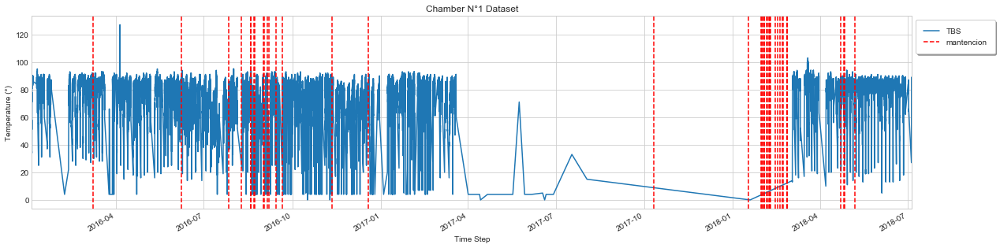

In [9]:
chamber = 1
fname = 'chamber_{}_data.png'.format(chamber)
tname = 'Chamber N°{} Dataset'.format(chamber)
mantencion = m1
serie = c1[['TBS']]
plot_chamber_serie(serie, fname, tname, mantencion=mantencion)

### 5.1.1 Chamber 1: 2016

2016-01-04 21:09:34  to  2018-07-05 15:10:17


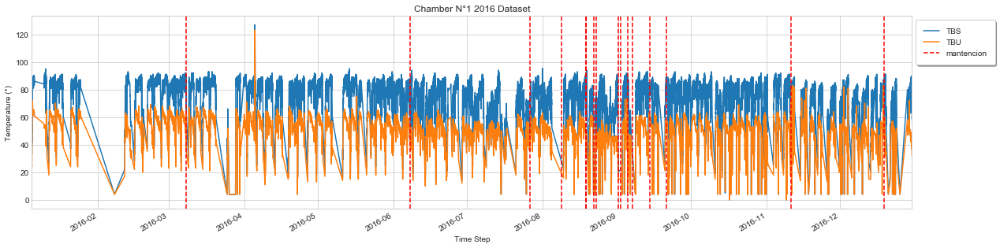

In [10]:
print(c1.index[0],' to ',c1.index[-1])
chamber = 1
year = 2016
fname = 'chamber_{}_{}_data.png'.format(chamber, year)
tname = 'Chamber N°{} {} Dataset'.format(chamber, year)
start = '2016'
mantencion = m1
serie = c1[['TBS','TBU']]
plot_chamber_serie(serie, fname, tname, mantencion=mantencion, start=start)


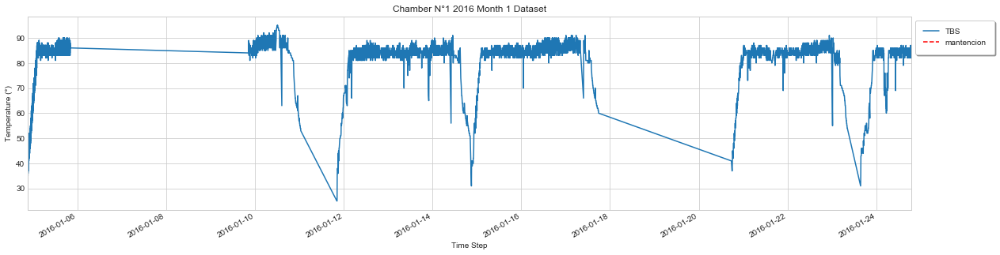

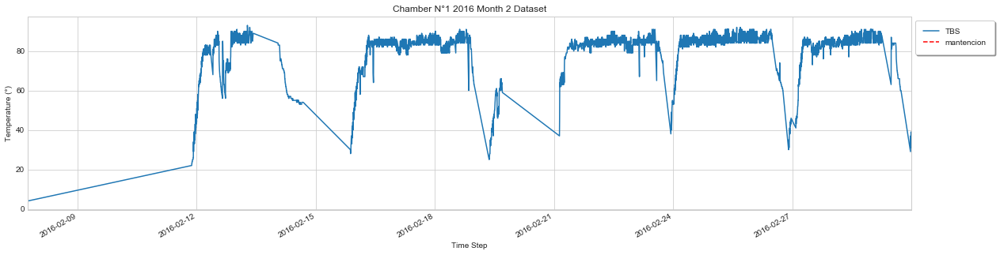

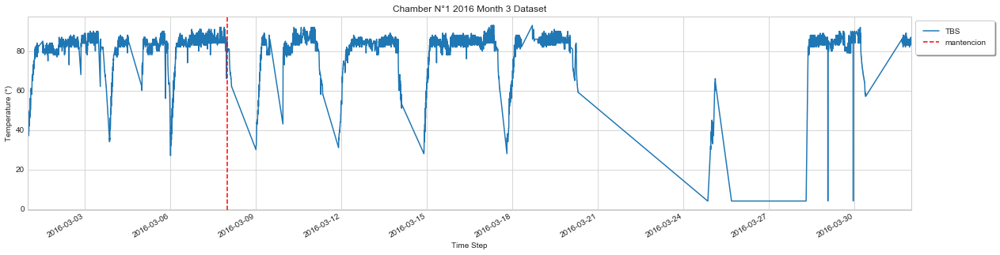

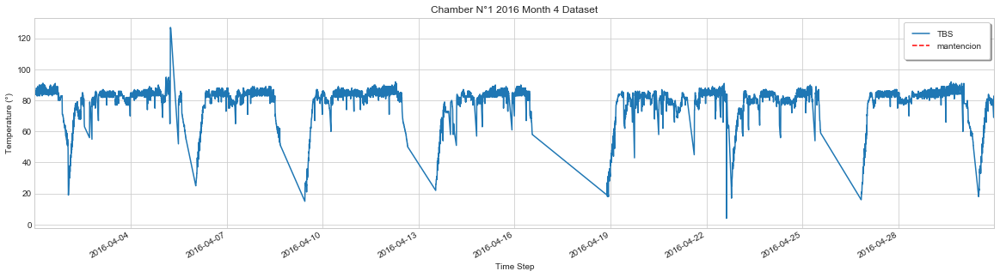

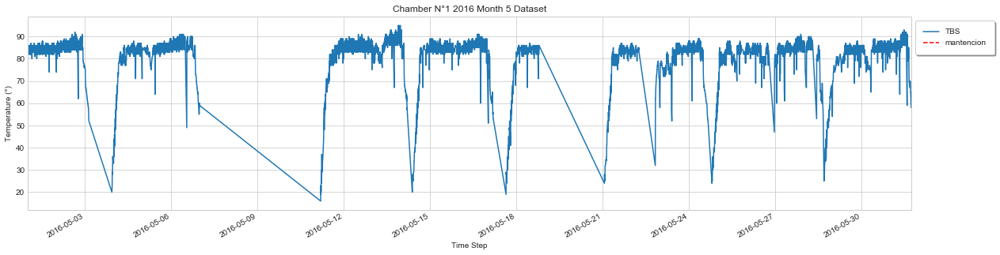

...

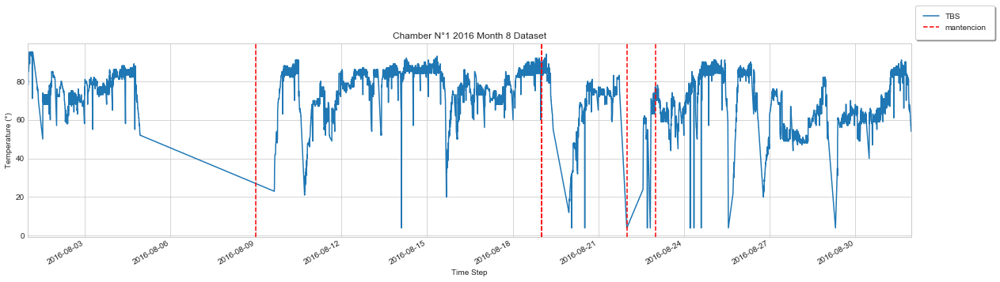

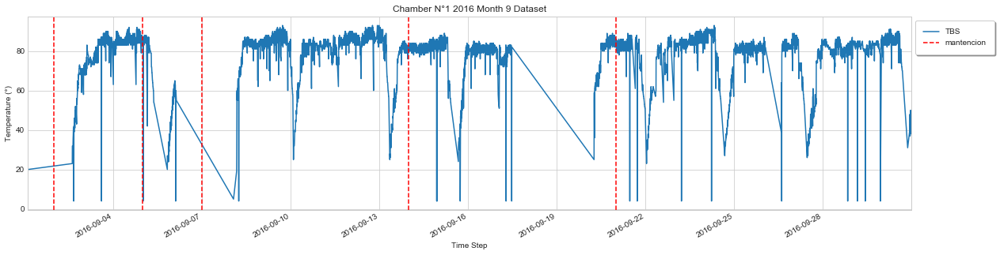

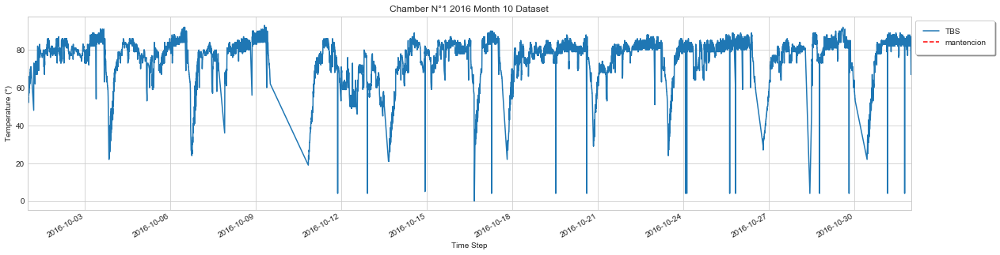

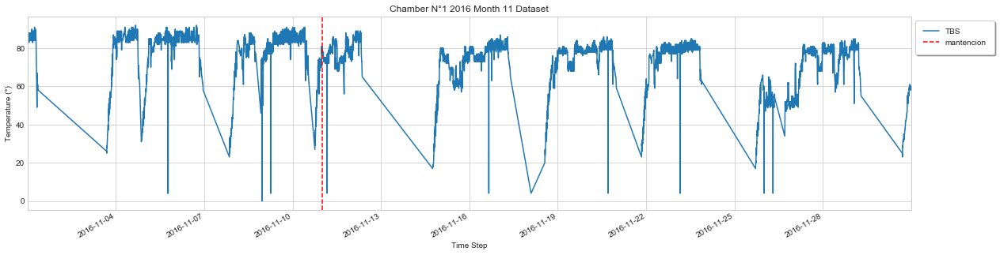

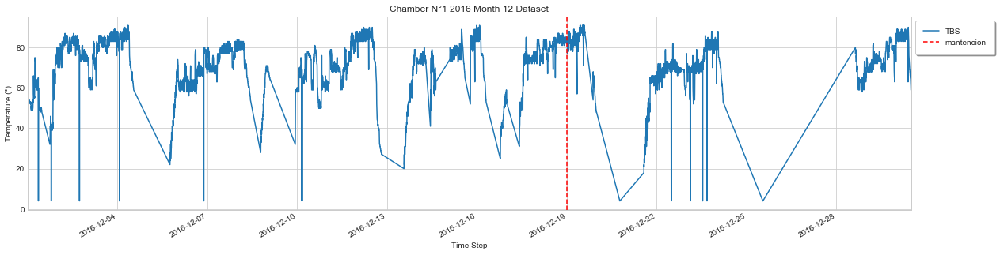

In [11]:
#revisar fin e inicio sec
for i in range(1,13):
    chamber = 1
    year = 2016
    fname = 'chamber_{}_{}_{}data.png'.format(chamber, year, i)
    tname = 'Chamber N°{} {} Month {} Dataset'.format(chamber, year, i)
    start = '2016-0{}'.format(i)
    mantencion = m1
    serie = c1[['TBS']]
    plot_chamber_serie(serie, fname, tname, mantencion=mantencion, start=start, end_dates=proces_ends, start_dates=proces_starts)

108213


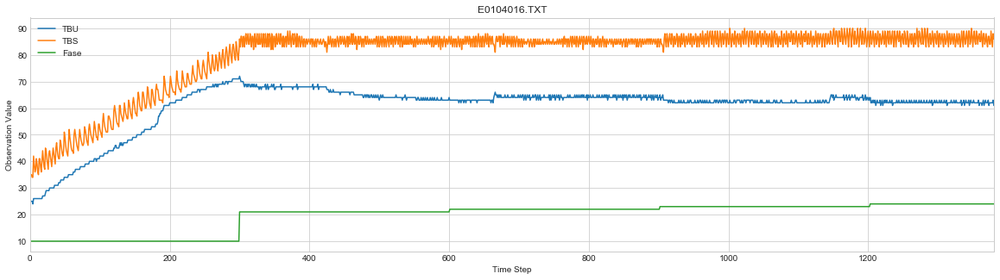

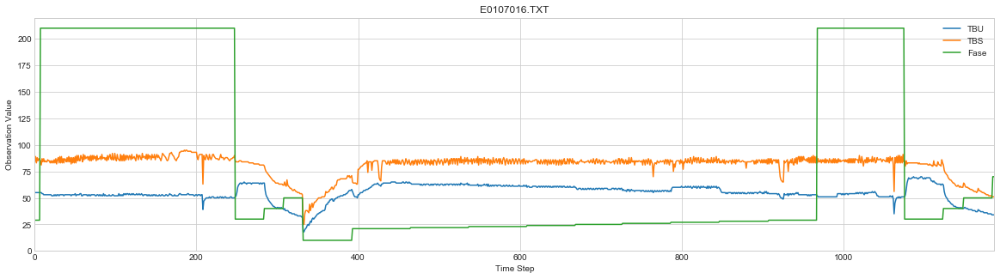

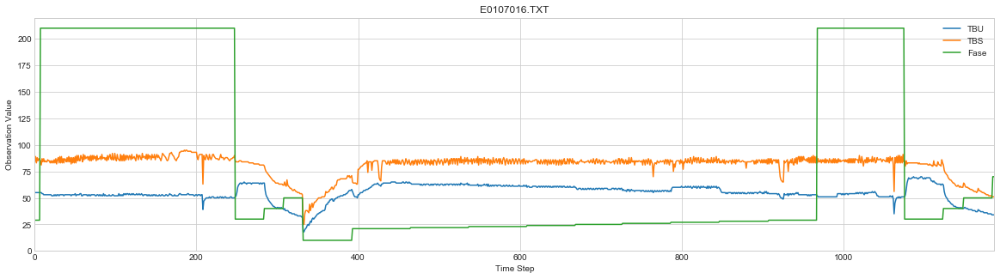

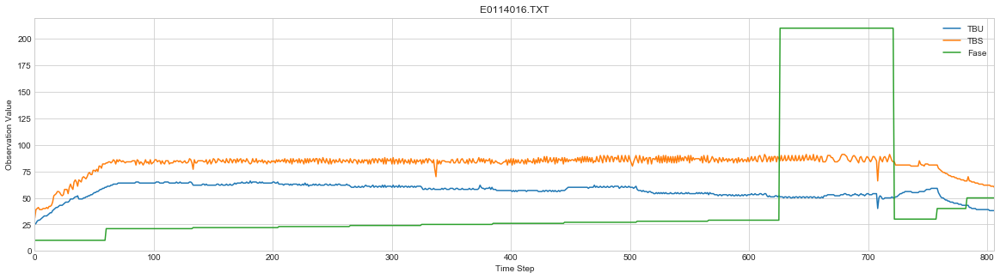

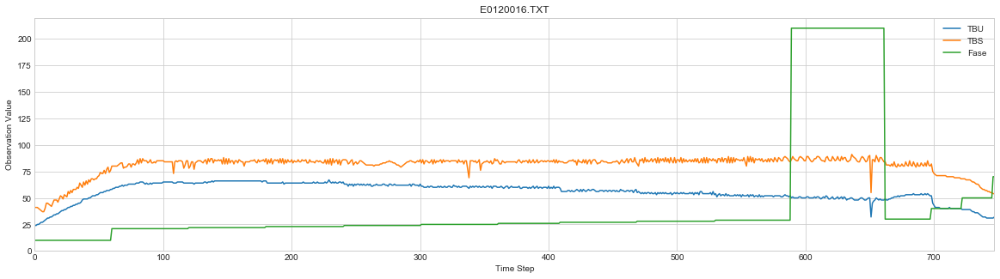

...

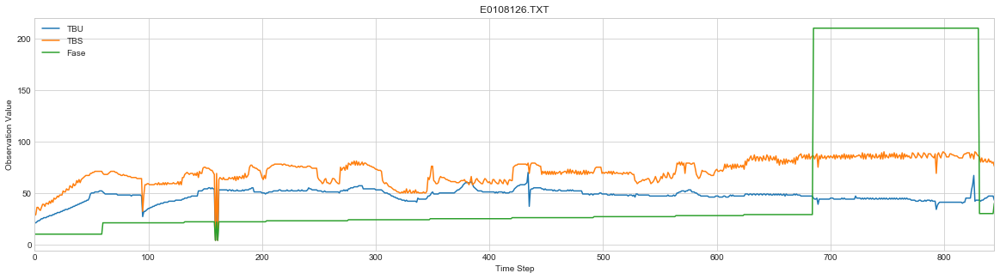

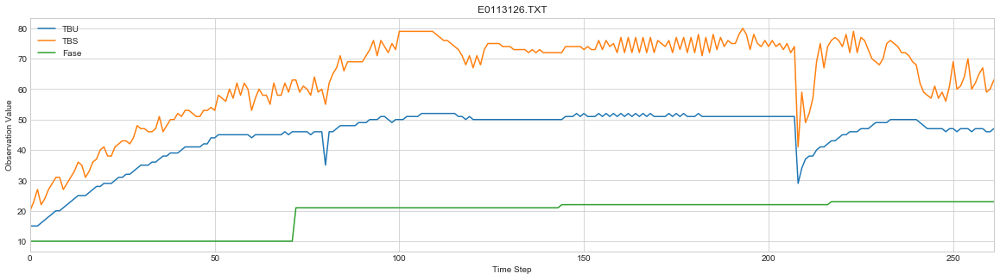

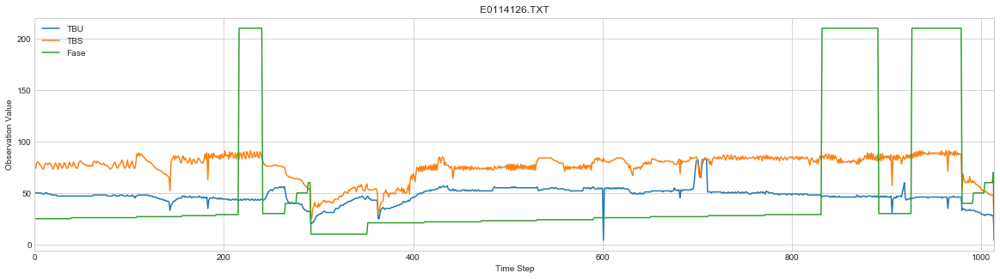

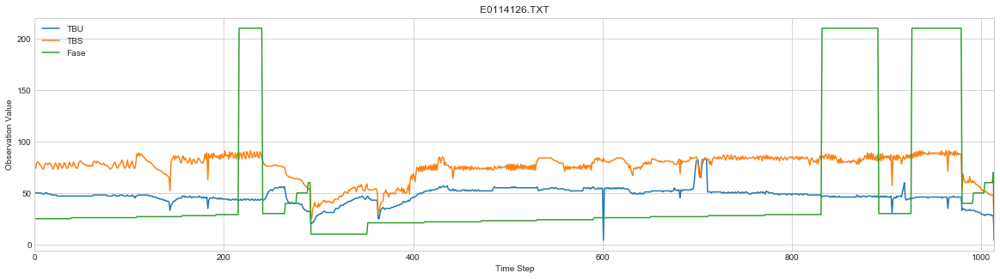

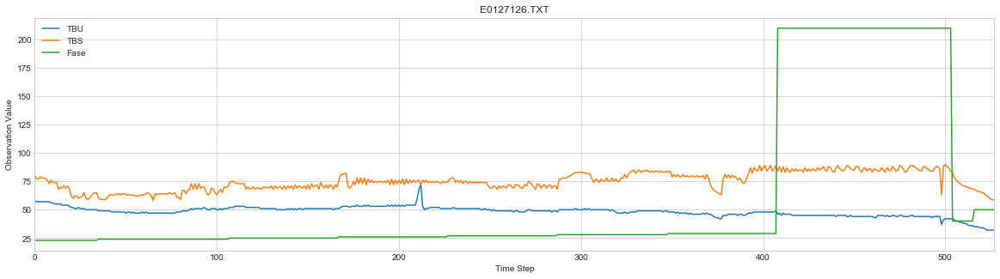

71


In [12]:
print(c1.shape[0])
total = 0
i = 0
step_count = 0
steps = []
proceso = c1.proceso.tolist()[0]
total= 0
# print(proceso)
while i <= c1_2016.shape[0]:
    pname = c1.iloc[i]['proceso']
    pdict = procesos[pname]
    start = str(pdict['inicio'])
    end = str(pdict['termino'])
    steps = pdict['steps']
    
    df = c1.loc[start:end]
    df[['TBU','TBS','Fase']].reset_index().plot(figsize=(20,5))
    plt.title(pname)
    plt.ylabel('Observation Value')
    plt.xlabel('Time Step')
    plt.show()
    
    i += steps
    total += 1
print(total)

# Selecting Normal and Anomaly data

In [13]:
camara = 'E01'
year = '6'
files = ['1401', '2001', '0102', '0604', '0904', '1804', '2204', '2604', '3004', '0305','2405','0206','0406','1806','2206',
        '2906','1508','1908','2508','2608','0209','1009','1309','2209','2409','2709','3009','0310','0610',
        '1010','1310','1610','1710','2010','1011','1411', '2111','2511','0512','0812']
ready_files = [camara + x + year + '.TXT' for x in files]
print(len(ready_files))

df =  c1_2016[c1_2016['proceso'].str.contains('|'.join(ready_files))]
print(c1_2016.shape)
print(df.shape)

40
(68388, 64)
(31077, 64)


In [14]:
df

,Vent,Unkwn1,Unkwn2,Fase,TBS,TBU,UR,Unkwn3,Duracion_fase,UMd,...,Exte7,Exte8,Exte9,Exte10,Exte11,time_step,Unkwn4,Vent_dir,nro_camara,proceso
2016-01-14 21:05:12,,L,0.0,10.0,31.0,25.0,62.0,0.0,1.0,0.0,...,0.0,0.0,0.0,0.0,0.0,5.0,8219.0,1.0,1,E0114016.TXT
2016-01-14 21:10:12,<-,L,0.0,10.0,39.0,26.0,37.0,0.0,6.0,0.0,...,0.0,0.0,0.0,0.0,0.0,5.0,8476.0,1.0,1,E0114016.TXT
2016-01-14 21:15:12,<-,L,0.0,10.0,40.0,28.0,40.0,0.0,11.0,0.0,...,0.0,0.0,0.0,0.0,0.0,5.0,8476.0,1.0,1,E0114016.TXT
2016-01-14 21:20:12,<-,L,0.0,10.0,41.0,29.0,45.0,0.0,16.0,0.0,...,0.0,0.0,0.0,0.0,0.0,5.0,8733.0,1.0,1,E0114016.TXT
2016-01-14 21:25:12,<-,L,0.0,10.0,39.0,29.0,48.0,0.0,21.0,0.0,...,0.0,0.0,0.0,0.0,0.0,5.0,8990.0,1.0,1,E0114016.TXT
2016-01-14 21:30:12,<-,L,0.0,10.0,39.0,30.0,55.0,0.0,26.0,0.0,...,0.0,0.0,0.0,0.0,0.0,5.0,9247.0,1.0,1,E0114016.TXT
2016-01-14 21:35:12,<-,L,0.0,10.0,39.0,31.0,56.0,0.0,31.0,0.0,...,0.0,0.0,0.0,0.0,0.0,5.0,9504.0,1.0,1,E0114016.TXT
2016-01-14 21:40:13,<-,L,0.0,10.0,40.0,32.0,56.0,0.0,36.0,0.0,...,0.0,0.0,0.0,0.0,0.0,5.0,9761.0,1.0,1,E0114016.TXT
2016-01-14 21:45:13,<-,L,0.0,10.0,40.0,33.0,60.0,0.0,41.0,0.0,...,0.0,0.0,0.0,0.0,0.0,5.0,10018.0,1.0,1,E0114016.TXT
2016-01-14 21:50:13,<-,L,0.0,10.0,40.0,33.0,60.0,0.0,46.0,0.0,...,0.0,0.0,0.0,0.0,0.0,5.0,10275.0,1.0,1,E0114016.TXT


C:\Users\joaquin\Anaconda3\lib\site-packages\matplotlib\pyplot.py:523: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


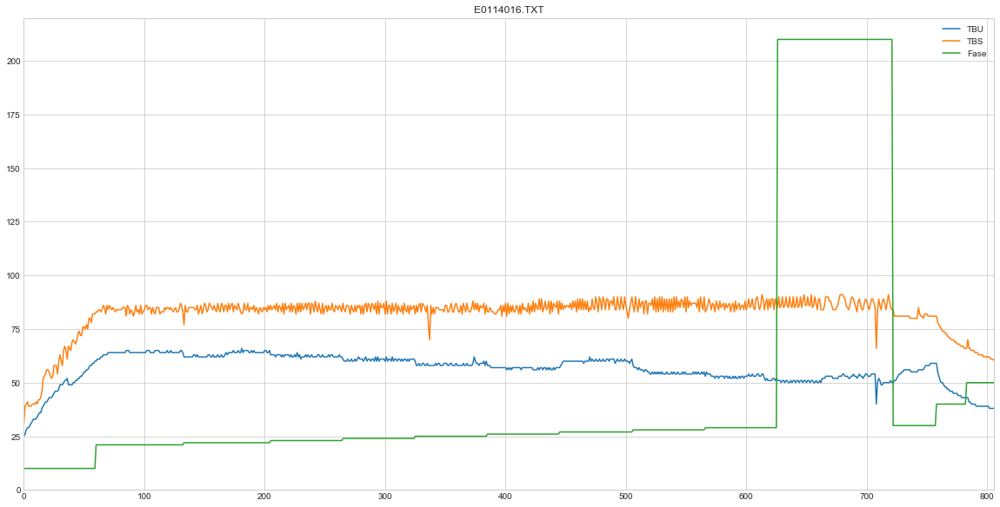

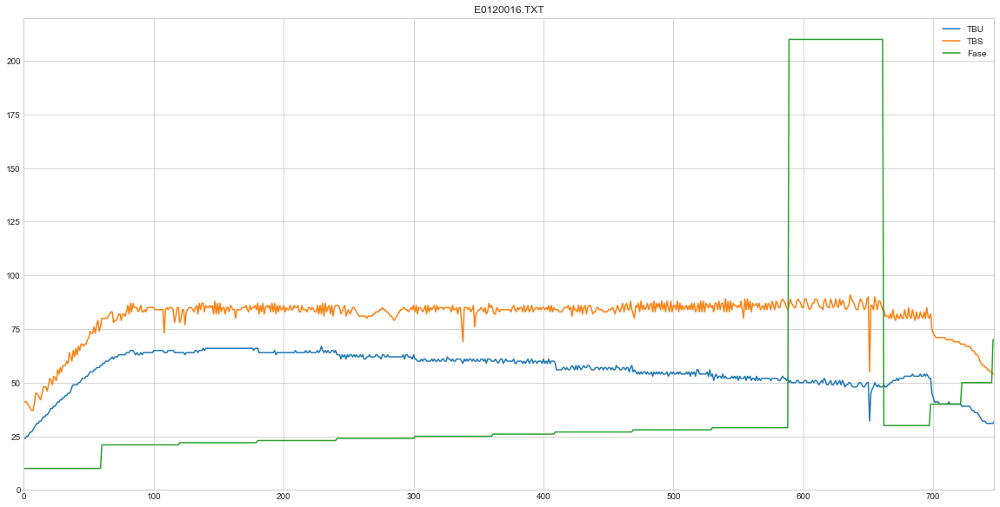

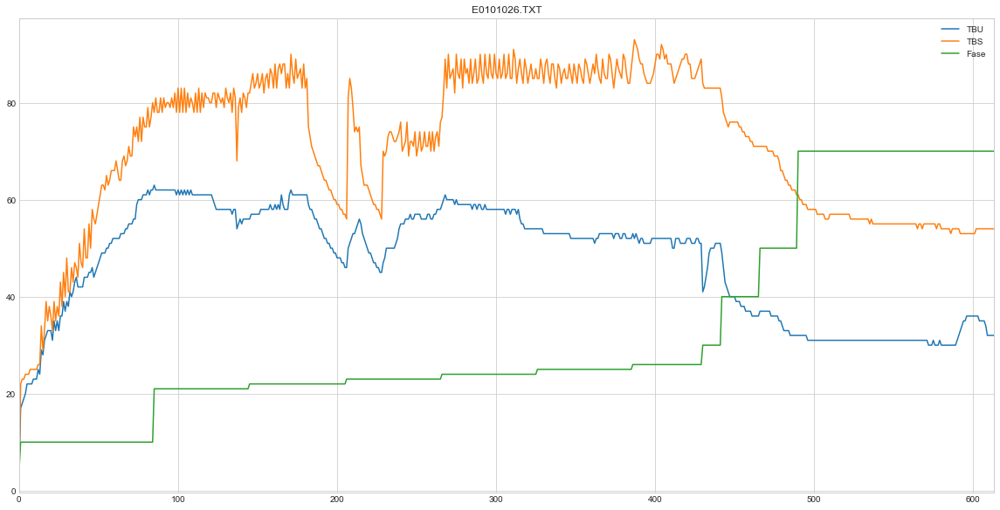

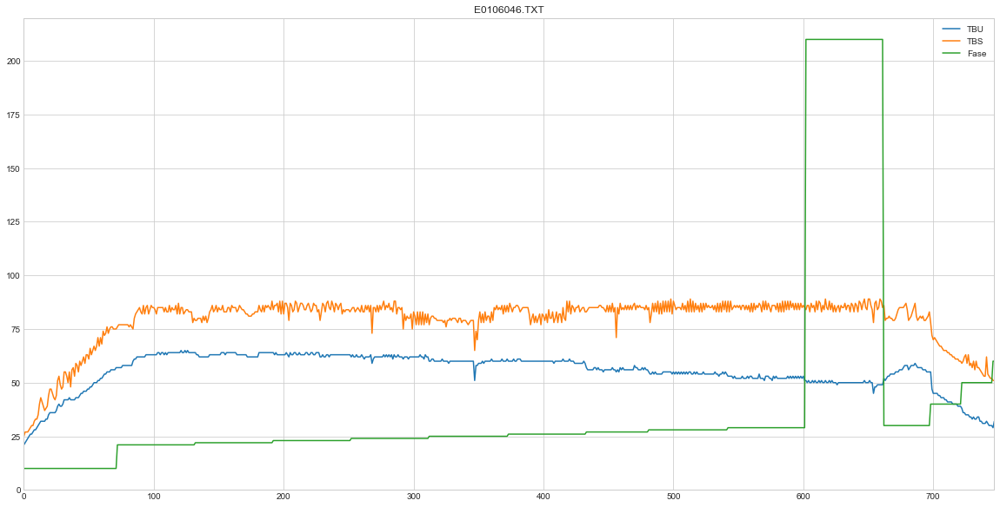

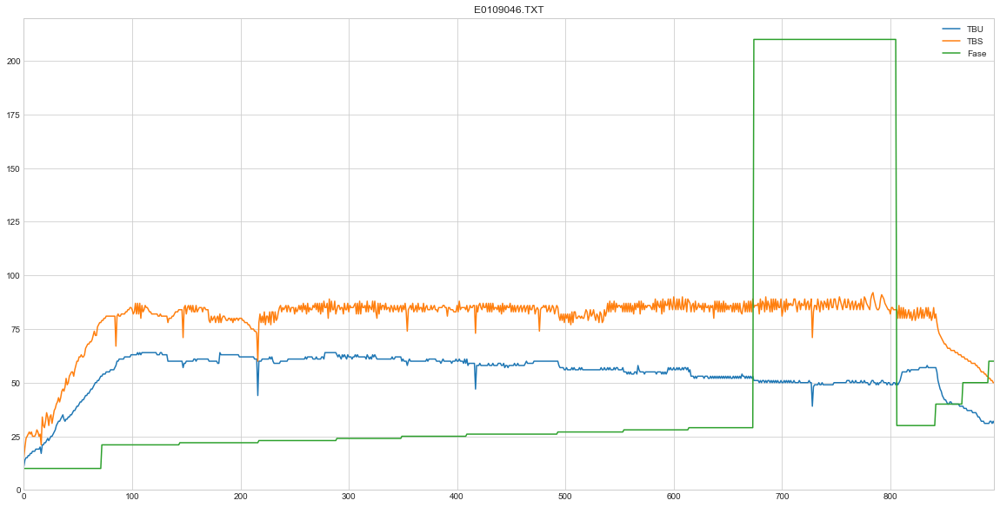

...

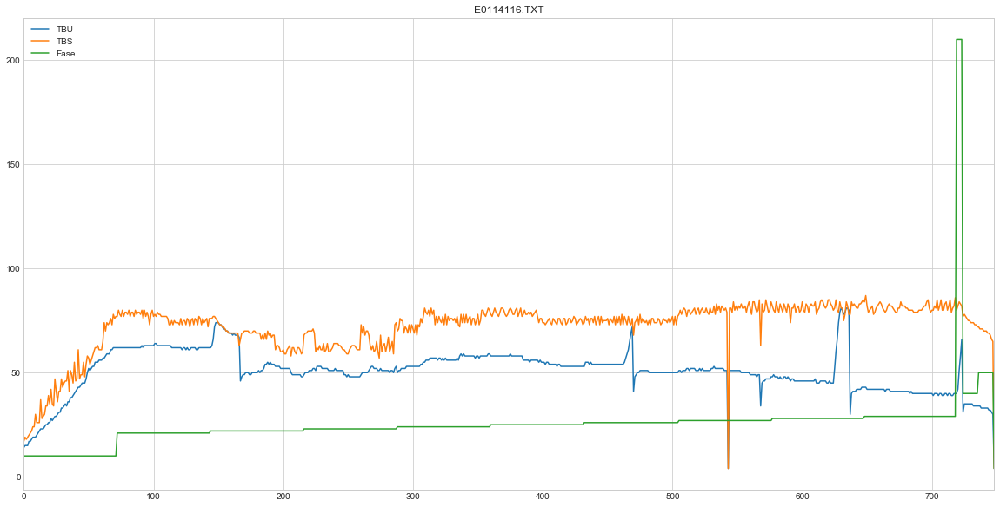

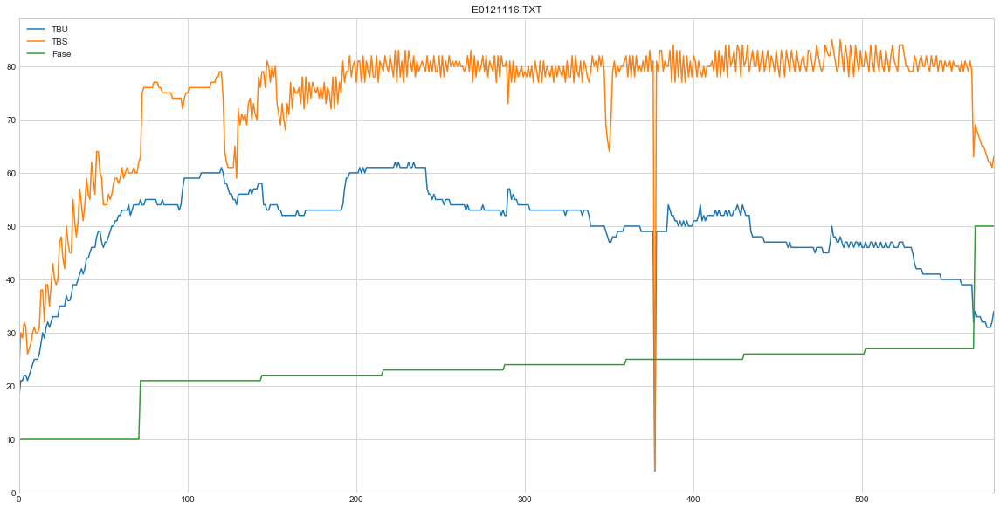

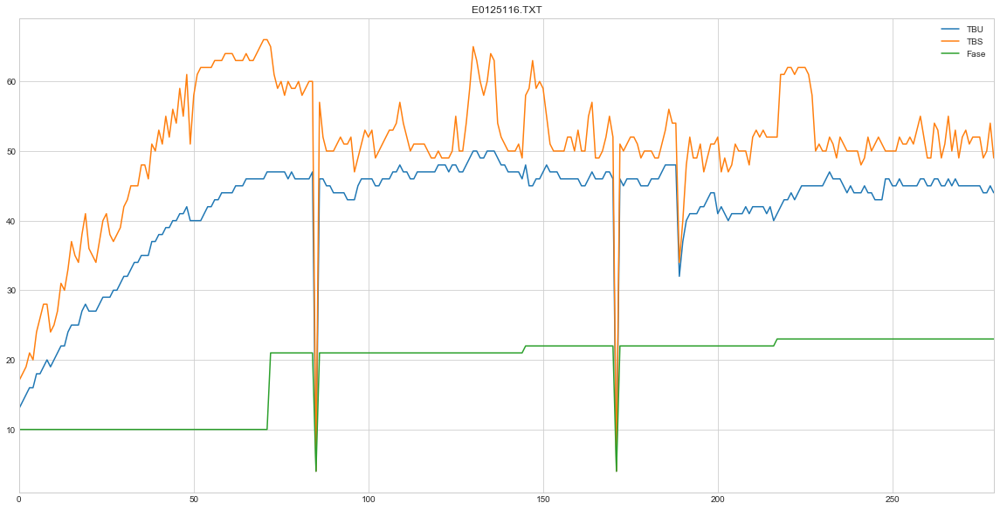

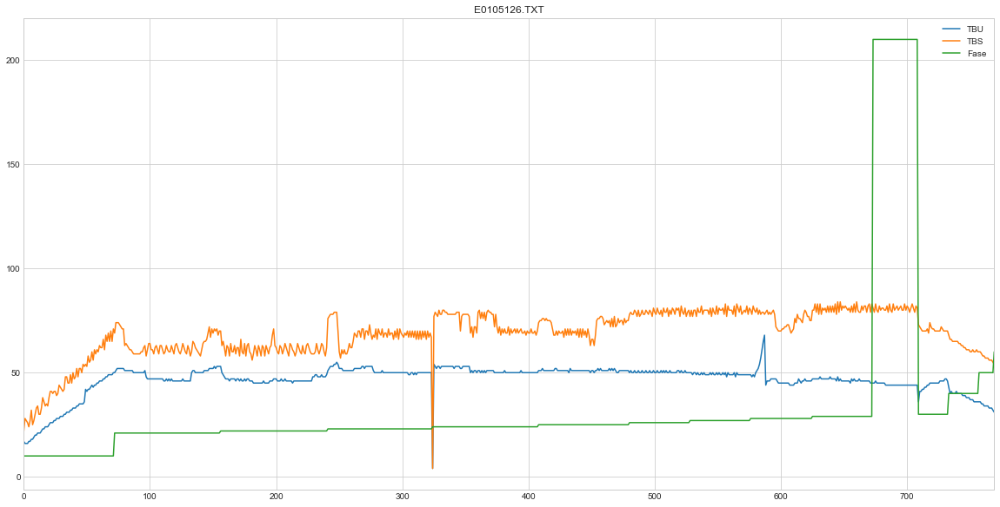

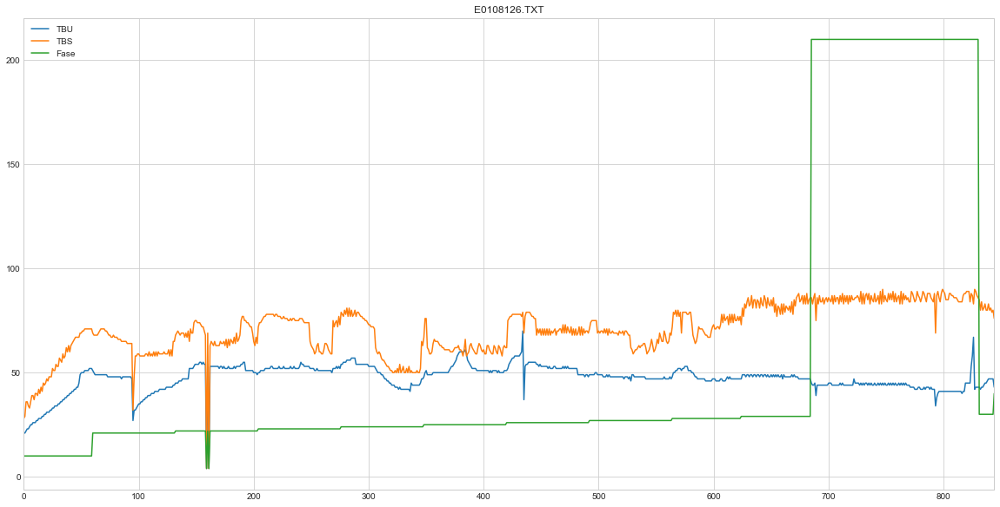

In [15]:
total = 0
i = 0
step_count = 0
steps = []
proceso = df.proceso.tolist()[0]
total= 0
# print(df.proceso.nunique())
# print(proceso)
for p in df.proceso.unique():
    tmp = df[df['proceso']==p]
    tmp[['TBU','TBS','Fase']].reset_index().plot(figsize=(20,10))
    plt.title(p)

In [41]:
camara = 'E01'
year = '6'

anomalies_test = ['1401', 
                  '0102', '2204', '0305', '2405','1908', '2608', '2409', '3009', '0310', '1010', '1011',
                 '2001', 
                  '0604', 
                  '0904', 
                  '1804'
                 ]

anomalies_val1 = ['0206', 
                  '0406', '1806', '2206', '1508', '1804', '2604', '3004', 
                  '2906', 
                  '2508'
                 ]

normal = ['2001', '0604', 
          '0904', 
          '1804', 
          '2604', 
          '3004', '2906', '2508', '1309', '2209',
          '2508', '0209', '1309', '2209', '2709', '1710', 
          '2010'
         ]

print('Test T Size', len(anomalies_test))
print('Test Val Size', len(anomalies_val1))
print('Test N Size', len(normal))

ready_anomalies_test = [camara + x + year + '.TXT' for x in anomalies_test]
ready_anomalies_val1 = [camara + x + year + '.TXT' for x in anomalies_val1]
ready_normal = [camara + x + year + '.TXT' for x in normal]

c1_2016['anomaly'] = 0

anomaly_test_set =  c1_2016[c1_2016['proceso']\
                            .str.contains('|'.join(ready_anomalies_test))][['TBS', 'anomaly']]
anomaly_val1_set =  c1_2016[c1_2016['proceso']\
                            .str.contains('|'.join(ready_anomalies_val1))][['TBS', 'anomaly']]
normal_set =  c1_2016[c1_2016['proceso']\
                      .str.contains('|'.join(ready_normal))][['TBS', 'anomaly']]

print('\nTotal Year ', c1_2016.shape)
print('Test ', anomaly_test_set.shape)
print('Val1 ', anomaly_val1_set.shape)
print('Normal ', normal_set.shape)
# print(len(ready_files))

Test T Size 16
Test Val Size 10
Test N Size 17

Total Year  (68388, 65)
Test  (13389, 2)
Val1  (8196, 2)
Normal  (10779, 2)


C:\Users\joaquin\Anaconda3\lib\site-packages\ipykernel_launcher.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy


In [42]:
df_train = normal_set.copy()
df_test = anomaly_test_set.copy()
df_validation1 = anomaly_val1_set.copy()
df_validation2 = anomaly_test_set.copy()


Size of train: 10779
Size of test: 13389
Size of validation1: 8196
Size of validation2: 13389
Total: 45753
Ratio of train: 0.235591
Ratio of test: 0.292637
Ratio of validation1: 0.179136
Ratio of validation2: 0.292637


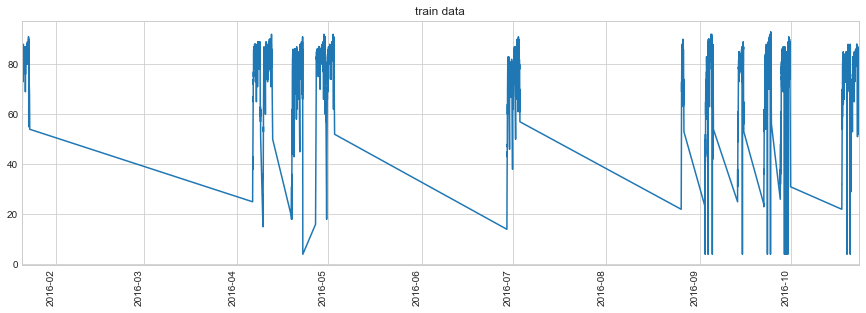

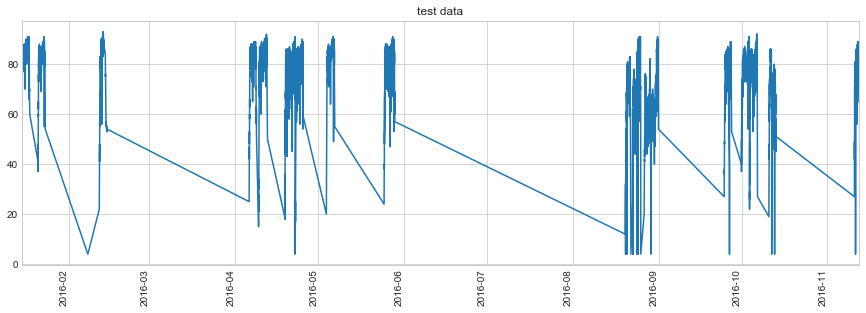

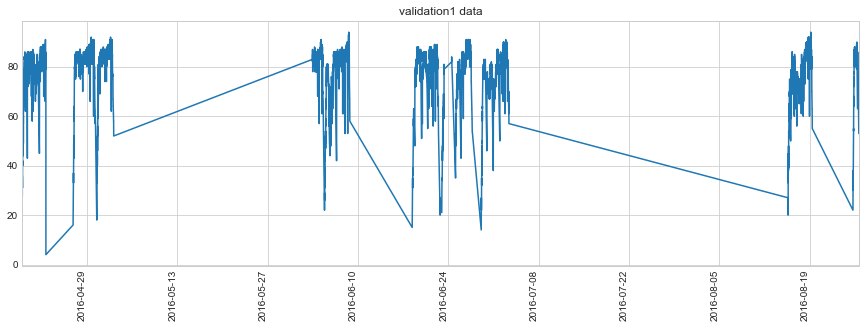

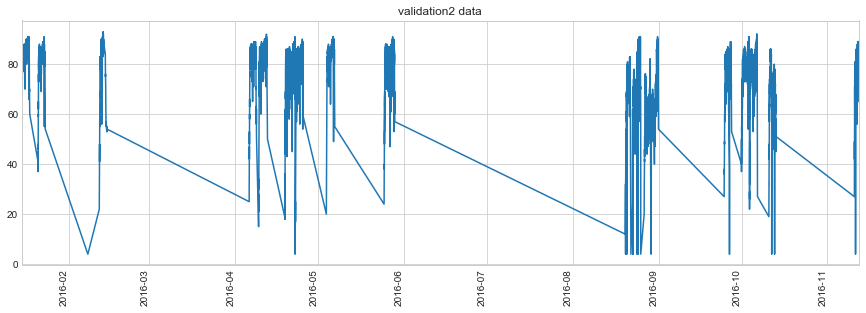

In [43]:
df_dict = {}
df_dict['train'] = df_train
df_dict['test'] = df_test
df_dict['validation1'] = df_validation1
df_dict['validation2'] = df_validation2

count = 0
for key in df_dict:
    print ("Size of %s: %d"%(key,df_dict[key].shape[0]))
    count += df_dict[key].shape[0]
print ("Total: %d"%(count))

for key in df_dict:
    print ("Ratio of %s: %f"%(key,float(df_dict[key].shape[0])/count))

    
for key in df_dict:
    df_tmp = df_dict[key]
    plt.figure()
    df_tmp['TBS'].plot(figsize=(15,5))
    rows = df_tmp[df_tmp.anomaly.isin([1])].itertuples()
    for row in rows:
        print (row)
        plt.plot(row[0], row[1], 'r.', markersize=10.0)
    plt.xticks(rotation='vertical')
    plt.title("%s data"%(key))
    plt.show()

In [44]:
for key in df_dict:
    np.save("..\\lstm_anomaly_thesis\\resources\\data\\discords\\AH\\%s"%(key),df_dict[key])

In [20]:
#Detection code starts here
#Detection code starts here
#Detection code starts here
#Detection code starts here

In [21]:
data_folder = "..\\lstm_anomaly_thesis\\resources\\data\\discords\\AH\\"

In [22]:
#load training data
train_predictions = np.load(data_folder+"train_predictions.npy")
train_true = np.load(data_folder+"train_true.npy")
print (train_predictions.shape)
print (train_true.shape)


(4061, 5)
(4061,)


In [23]:
#load validation2 data
validation2_predictions = np.load(data_folder+"validation2_predictions.npy")
validation2_true = np.load(data_folder+"validation2_true.npy")
validation2_labels = np.load(data_folder+"validation2_labels.npy")
print (np.shape(validation2_predictions))
print (np.shape(validation2_true))
print (np.shape(validation2_labels))
validation2_labels = np.reshape(validation2_labels,[len(validation2_labels),np.shape(validation2_labels)[1]])
print (np.shape(validation2_labels))

(1737, 5)
(1737,)
(1737, 5, 1)
(1737, 5)


In [24]:
# load test data
test_predictions = np.load(data_folder+"test_predictions.npy")
test_true = np.load(data_folder+"test_true.npy")
test_labels = np.load(data_folder+"test_labels.npy")
print (np.shape(test_predictions))
print (np.shape(test_true))
test_labels = np.reshape(test_labels,[len(test_labels),np.shape(test_labels)[1]])
print (np.shape(test_labels))

(1737, 5)
(1737,)
(1737, 5)


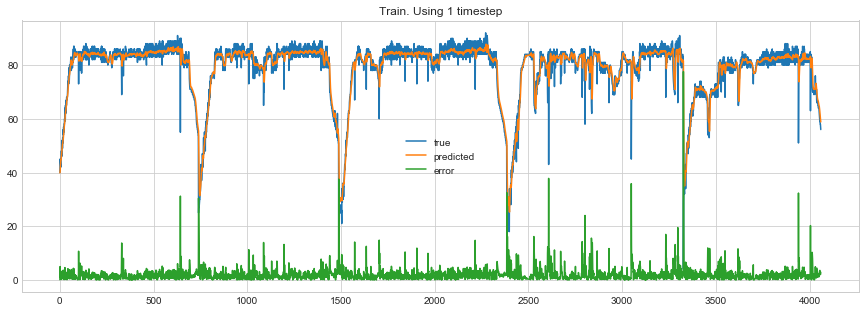

In [25]:
plt.figure(figsize=(15,5))
plt.plot(train_true,label='true')
plt.plot(train_predictions[:,0],label='predicted')
plt.plot(abs(train_true - train_predictions[:,0]), label='error')
plt.legend()
plt.title("Train. Using 1 timestep")
plt.show()

-0.006059746647139439
3.4879520570998457


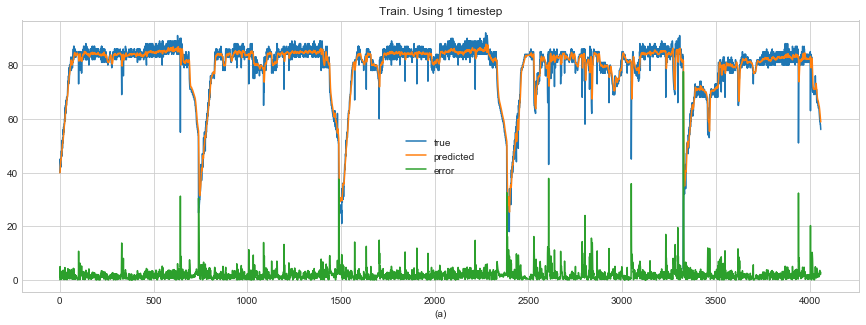

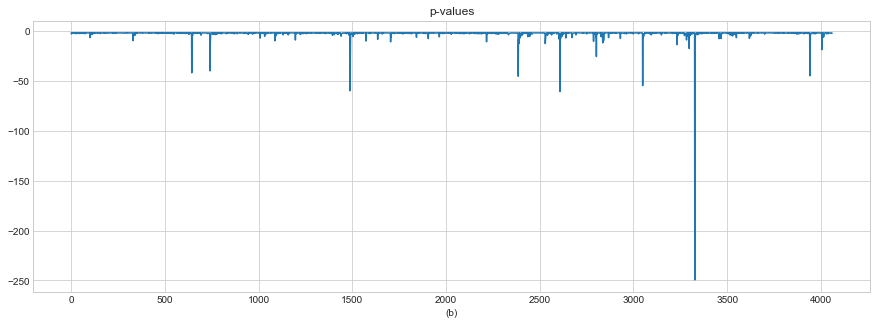

In [26]:
#error vectors
from scipy.stats import norm

train_error_vectors = np.zeros(np.shape(train_predictions))
n_cols = np.shape(train_predictions)[1]
for i in range(n_cols):
    train_error_vectors[:,i] =  train_true -train_predictions[:,i]

#ERROR DIMENSION
error_dimension = 1
train_error_vectors = train_error_vectors[:,0:error_dimension]
mean = np.mean(train_error_vectors)
std = np.std(train_error_vectors)
print (mean)
print (std)
p_values= norm(loc=mean, scale=std).logpdf(train_error_vectors)

plt.figure(figsize=(15,5))
plt.plot(train_true,label='true')
plt.plot(train_predictions[:,0],label='predicted')
plt.plot(abs(train_true - train_predictions[:,0]),label='error')
plt.title("Train. Using 1 timestep")
plt.xlabel("(a)")
plt.legend()

plt.figure(figsize=(15,5))
plt.plot(p_values)
plt.title("p-values")
plt.xlabel("(b)")
plt.show()

train_errors_1 = train_true - train_predictions[:,0]

In [27]:
v2_error_vectors = np.zeros(np.shape(validation2_predictions))
for i in range(n_cols):
    v2_error_vectors[:,i] =  validation2_true -validation2_predictions[:,i]

v2_error_vectors = v2_error_vectors[:,0:error_dimension]
v2_p_values= norm(loc=mean, scale=std).logpdf(v2_error_vectors)

print ()
test_error_vectors = np.zeros(np.shape(test_predictions))
for i in range(n_cols):
    test_error_vectors[:,i] =  test_true -test_predictions[:,i]
test_error_vectors = test_error_vectors[:,0:error_dimension]
test_p_values= norm(loc=mean, scale=std).logpdf(test_error_vectors)

test_true_anomalies = np.where(test_labels[:,0]==1)

(array([ 799,  800, 1022, 1216, 1463], dtype=int64), array([0, 0, 0, 0, 0], dtype=int64))


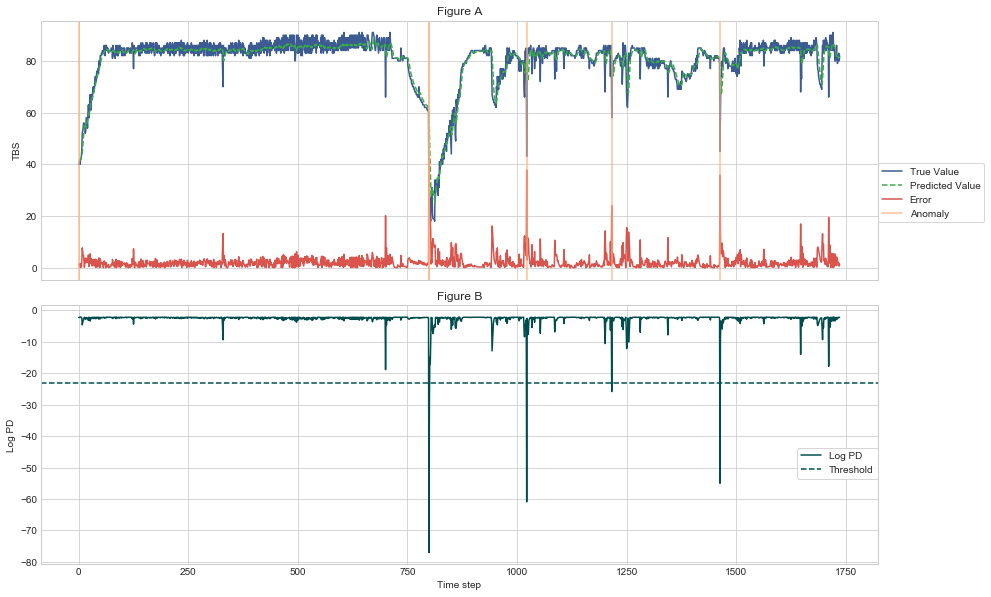

In [28]:
import matplotlib.gridspec as gridspec
threshold_v2 = -23

f = plt.figure(figsize=(15,10))
plt.subplots_adjust(hspace=0.1)

gs1 = gridspec.GridSpec(1, 2)
gs1.update(wspace=0.025, hspace=0.05)

v2_below_threshold = np.where(v2_p_values <= threshold_v2)
print (v2_below_threshold)

ax1 = plt.subplot(211)
ax1.plot(validation2_true,label='True Value',color=sns.xkcd_rgb["denim blue"])
ax1.plot(validation2_predictions[:,0],ls ='dashed',label='Predicted Value',color=sns.xkcd_rgb["medium green"])
ax1.plot(abs(validation2_true - validation2_predictions[:,0]),label='Error',color=sns.xkcd_rgb["pale red"])
ax1.axvline(x=0, color=sns.xkcd_rgb["peach"], alpha=0.8, label='Anomaly')

for column in v2_below_threshold[0]:
    ax1.axvline(x=column,color=sns.xkcd_rgb["peach"],alpha=.8)
#for row in v2_true_anomalies:
#    plt.plot(row, validation2_true[row], 'r.', markersize=20.0)
ax1.legend(bbox_to_anchor=(1,.45),borderaxespad=0.,frameon=True)
ax1.set_title('Figure A')
plt.ylabel("TBS")
#plt.title("Validation2. Using 1 timestep")


#plot v2 log PD
ax2 = plt.subplot(212, sharex=ax1)
ax2.plot(v2_p_values,label='Log PD',color=sns.xkcd_rgb["dark teal"])
ax2.axhline(y=threshold_v2,ls='dashed',label='Threshold',color=sns.xkcd_rgb["dark teal"])
ax2.legend(bbox_to_anchor=(1, .45), borderaxespad=0.,frameon=True)
ax2.set_title('Figure B')
# ax2.text(.5, .05, '(b)', ha='center')
plt.ylabel("Log PD")

#plt.title("Validation2 p-values")

#Set up the xlabel and xtick
#xticklabels = ax1.get_xticklabels() + ax2.get_xticklabels()
xticklabels = ax1.get_xticklabels()
plt.setp(xticklabels, visible=False)
plt.xlabel("Time step")
plt.show()
pp = PdfPages('AH.pdf')
pp.savefig(f)
pp.close()

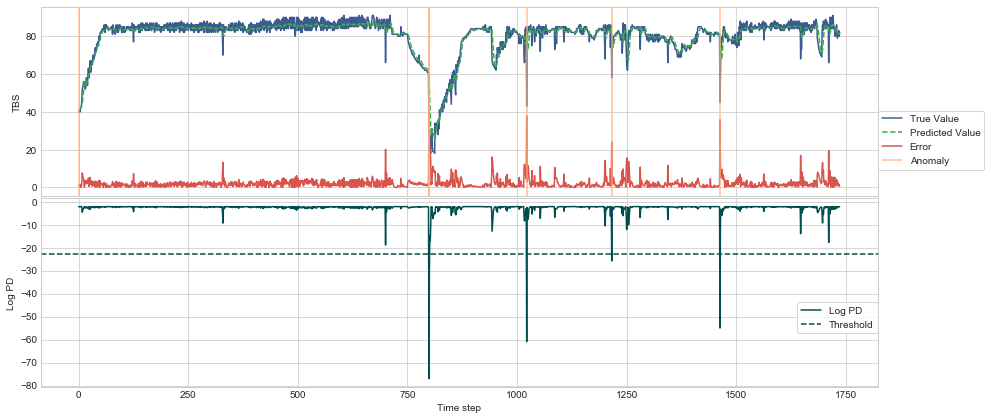

In [29]:
test_below_threshold = np.where(test_p_values <= threshold_v2)
#plot test data
f = plt.figure(figsize=(15,7))
plt.subplots_adjust(hspace=0.01)

ax1 = plt.subplot(211)
ax1.plot(test_true, label='True Value', color=sns.xkcd_rgb["denim blue"])
ax1.plot(test_predictions[:,0], ls ='dashed', label='Predicted Value', color=sns.xkcd_rgb["medium green"])
ax1.plot(abs(test_true - test_predictions[:,0]), label='Error', color=sns.xkcd_rgb["pale red"])

ax1.axvline(x=0, color=sns.xkcd_rgb["peach"], alpha=0.8, label='Anomaly')
for column in test_below_threshold[0]:
    ax1.axvline(x=column,color=sns.xkcd_rgb["peach"],alpha=0.8)
#for row in test_true_anomalies:
#    plt.plot(row, test_true[row], 'r.', markersize=20.0)
ax1.legend(bbox_to_anchor=(1, .45), borderaxespad=0.,frameon=True)
plt.ylabel("TBS")
#plt.title("Test. Using 1 timestep")

ax2 = plt.subplot(212, sharex=ax1)
ax2.plot(test_p_values,label='Log PD',color=sns.xkcd_rgb["dark teal"])
ax2.axhline(y=threshold_v2,ls='dashed',label='Threshold',color=sns.xkcd_rgb["dark teal"])
ax2.legend(bbox_to_anchor=(1, .45), borderaxespad=0.,frameon=True)
plt.ylabel("Log PD")
#plt.title("test p-values")

#Set up the xlabel and xtick
#xticklabels = ax1.get_xticklabels() + ax2.get_xticklabels()
xticklabels = ax1.get_xticklabels()
plt.setp(xticklabels, visible=False)
plt.xlabel("Time step")
plt.show()
pp = PdfPages('AH_test.pdf')
pp.savefig(f)
pp.close()

In [30]:
train_loss = [0.10699289017234616, 0.10966925915041738, 0.08447535473658857, 0.085047259417767501, 0.078818299071434658, 
              0.075503114102420291, 0.079146501952723033, 0.089050013254858659, 0.079120526558966092, 0.076340759007588452, 
              0.082741727444922766, 0.080261881907017385, 0.090172597098102963, 0.069755737404509438, 0.074218023097894506, 
              0.082787167318355642, 0.082324650045624725, 0.081610349526484827, 0.08094883962826499, 0.084740596013646974, 
              0.083094857304099615, 0.082572251604819236, 0.080948962302684307, 0.080171561591291601, 0.088889754421178371, 
              0.072743796294303525, 0.078544481039686864, 0.088582896991128687, 0.073822044385882926, 0.082400998155463423, 
              0.080204951634686175, 0.078249025511569661, 0.08175554669764773, 0.077694773998696801, 0.081510880489477369, 
              0.088650868249970677, 0.084171685028679319, 0.080241846977749096, 0.082702767939255836, 0.086307859928216241, 
              0.085045808802090062, 0.081234467710461916, 0.081766376273094854, 0.077703822375372225, 0.082805807800301973, 
              0.082474513055245391, 0.083559948121356128, 0.076778123902515649, 0.074074128975282288, 0.079748963787744945, 
              0.081897124768264828, 0.078976122007533844, 0.083714425557552319, 0.076738361884639422, 0.079123651139876419, 
              0.077237114542566918, 0.077705994441887374, 0.082520215291831442, 0.088736472487269263, 0.076143132283588377, 
              0.076226096450580913, 0.07802113446889479, 0.067789179498183777, 0.076770478204931561, 0.076778401518389397, 
              0.085326091412619973, 0.076473836988852448, 0.074434994028188123, 0.073946776998408126, 0.079403215952665807, 
              0.083055068692678313, 0.073274769717524127, 0.069832782196017393, 0.067333975621994446, 0.081142038666339039, 
              0.070842861914079749, 0.082353219980793299, 0.088273836809938236, 0.084132512190067718, 0.081464978844554795, 
              0.081901338795369094, 0.077499519913741058, 0.079382420068159903, 0.082084690521052814, 0.078742926297262122, 
              0.076530182754062384, 0.071593372362819957, 0.075515152453457066, 0.077668571163746827, 0.080118061246070182, 
              0.075983429067615557, 0.079712018875582144, 0.080794000331406005, 0.079549350884057013, 0.080734113862653209, 
              0.08351772070623377, 0.077407073107657862, 0.079710440002799671, 0.07898749623261643, 0.073945460730605067]
v1_loss =  [0.12807080031711399, 0.12667380820361149, 0.10367206429562918, 0.10461300315973324, 0.095927420963767829, 
            0.090977951047573502, 0.095344139530753505, 0.10698393246054923, 0.095384233418686654, 0.097355742826772382, 
            0.10215521992349917, 0.099737041653437705, 0.10772133191701271, 0.085225097989687817, 0.090218572547802564, 
            0.10011358712272886, 0.098638599477306535, 0.099285815758436757, 0.097568283478418991, 0.10394957657026048, 
            0.10060048319825433, 0.10031938026187406, 0.1004916109352289, 0.096565531360419746, 0.10746041279892589, 
            0.087087276499339825, 0.093692334542363323, 0.10638980643871503, 0.089250754709840743, 0.10255673417553364, 
            0.097094568368801815, 0.094701556911342147, 0.10259289421176018, 0.096506208949122554, 0.10015344023704528, 
            0.10875368978102939, 0.10138687974130603, 0.095522631563613819, 0.10013780352837613, 0.10635036337609384, 
            0.10232131052148211, 0.10055719275036293, 0.10067986214310869, 0.093279815958204657, 0.10138154933302421, 
            0.09871086108346358, 0.10376496138256808, 0.094156198021268511, 0.088720711098180569, 0.097667469643792609, 
            0.1002885720020608, 0.09622323745456085, 0.10406198084543322, 0.092704948749833399, 0.096627603116489588, 
            0.096783207464634757, 0.096723502362665192, 0.10129524935733353, 0.11022978698372081, 0.094068659052430864, 
            0.094195032970566875, 0.094557170630547874, 0.079766983541246422, 0.090646983288841951, 0.091149280571937566, 
            0.097898419293238698, 0.087990300395549878, 0.081382910048091714, 0.08666640323964972, 0.091990611878743606, 
            0.099112987805792752, 0.082928778227547531, 0.078972033184507615, 0.075665339023042941, 0.09404916849828536, 
            0.078010803351631269, 0.096410399444268866, 0.10350643707892541, 0.098336649413633501, 0.093998541872993654, 
            0.095161168125112397, 0.089631198712799093, 0.090877861558616935, 0.094726440433948428, 0.088407671645404848, 
            0.087316922570652253, 0.078639866766013228, 0.087627184007259148, 0.08305938755804719, 0.090839796273075799, 
            0.08638450405956094, 0.089664902011098571, 0.091811893077997059, 0.090700741067077179, 0.0913135012642282, 
            0.08963653293665165, 0.085276688970564229, 0.090021032494115555, 0.090241521596908569, 0.079823863040272586]
test_loss = [0.32396789373826818, 0.29756575692291881, 0.31263522869930493, 0.31309771750093235, 0.30847415299418102, 
             0.29527916392619208, 0.31339053786998561, 0.35623059370502885, 0.33366468810551875, 0.32572499749102207, 
             0.35257559681384432, 0.3395204009335136, 0.38584113074427223, 0.31994604148778572, 0.31688557979325915, 
             0.36472973399546466, 0.35262511623944526, 0.35014437281993371, 0.34449051703959765, 0.36064712768666957, 
             0.37490850569054196, 0.34857903373757587, 0.35430672709869154, 0.3428640107457932, 0.40475971317392284, 
             0.32007337965088567, 0.35344658295681991, 0.37313195049939629, 0.32985565766527858, 0.35569904691056758, 
             0.33983389256892693, 0.3444924413772138, 0.35030158562348535, 0.37328788576119015, 0.34444996771539094, 
             0.37645498082519563, 0.38598825190035896, 0.35607402492809226, 0.35828896953268757, 0.37667912117479713, 
             0.36025655893038733, 0.36491590217246977, 0.35899295819814742, 0.347154881923256, 0.34785865286563306, 
             0.34361917946497972, 0.3738543512581155, 0.35201704498457353, 0.34398791298041759, 0.35463960848835963, 
             0.35957765765884964, 0.34909081827843591, 0.35807381501740509, 0.33510136733753193, 0.34610986600298366, 
             0.35087531672202338, 0.34842332249106805, 0.35291127712074971, 0.38348996502196642, 0.34671032652020328, 
             0.33118811186107178, 0.36691714526527386, 0.31856803773770676, 0.33542081168531429, 0.34903661939832897, 
             0.35486644321742489, 0.3585875814015308, 0.37222108150429517, 0.33085811010683774, 0.34903247880106941, 
             0.36843051146405043, 0.34893656378062254, 0.31617924800678476, 0.33387273223841379, 0.3608847750394707, 
             0.33748230484985875, 0.35851557924385857, 0.37898909118412033, 0.37245693504874205, 0.34925802330559347, 
             0.35761831098876729, 0.34482095910005756, 0.35222199073693417, 0.36728029693657688, 0.36111624488375216, 
             0.37999480986421164, 0.30322295241457753, 0.35957162291137912, 0.32334483317595575, 0.36215916134008913, 
             0.34225546169047916, 0.34918822929689047, 0.36453614305778503, 0.35482765819578627, 0.35918695285756103, 
             0.34058275428586787, 0.36999181623405514, 0.36317346496609737, 0.35817555633858261, 0.36161456511018092]
lookback_limit =30
train_loss = train_loss[0:lookback_limit]

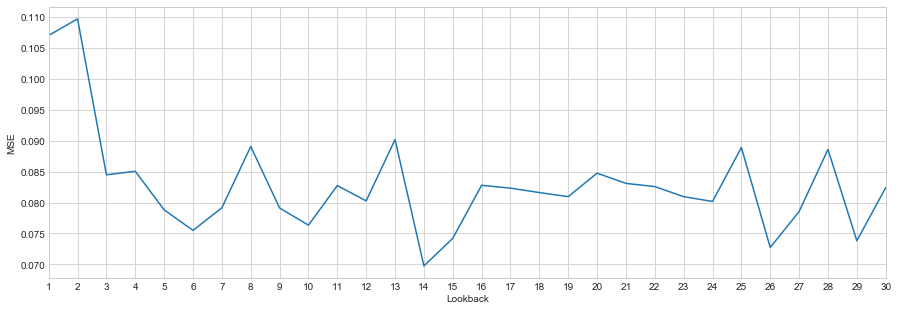

In [31]:
fig = plt.figure(figsize=(15,5))
plt.plot(np.append(np.roll(train_loss,1),train_loss[lookback_limit-1]),label='train')
#plt.plot(test_loss,label='test')
plt.xlim(1, lookback_limit)
plt.xticks(np.arange(1,lookback_limit+1,1))
#plt.legend()
plt.xlabel("Lookback")
plt.ylabel("MSE")
plt.show()
pp = PdfPages('ECG_lookbacks.pdf')
pp.savefig(fig)
pp.close()

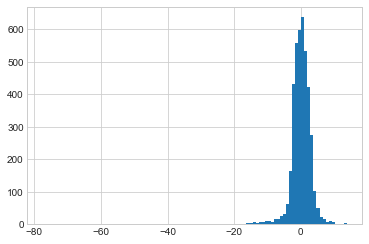

In [32]:
plt.hist(train_error_vectors,bins = 100)
plt.show()

In [33]:
import statsmodels.api as sm

C:\Users\joaquin\Anaconda3\lib\site-packages\statsmodels\compat\pandas.py:56: FutureWarning: The pandas.core.datetools module is deprecated and will be removed in a future version. Please use the pandas.tseries module instead.
  from pandas.core import datetools


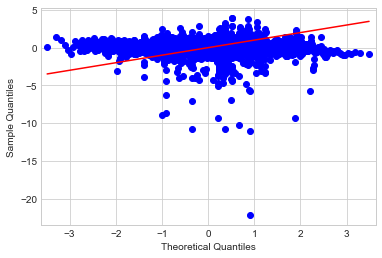

In [34]:
fig = sm.qqplot(train_error_vectors, fit=True,line='s')
plt.show()

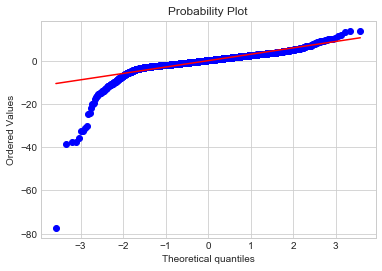

In [35]:
import scipy.stats as stats
import matplotlib.pylab as pylab

error_vectors = np.reshape(train_error_vectors,[len(train_error_vectors)])
stats.probplot(error_vectors, plot=pylab)
plt.show()

In [36]:
stats.normaltest(log_errors)

NameError: name 'log_errors' is not defined

### 5.1.1 Chamber 1: 2017

# Other Analysis